## Image denoising

In [249]:
from skimage import io, data, img_as_ubyte, filters, img_as_float
from skimage.color import rgb2gray
%matplotlib inline
import matplotlib.pyplot as plt
from scipy import fftpack
import numpy as np
from scipy.fft import fft2, fftshift, ifft2
import cv2
import os
# NLM FILTER
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma

#ssim and mse 
from skimage.metrics import structural_similarity as ssim, mean_squared_error as mse

# bm3d
import bm3d

from skimage.exposure import equalize_hist, match_histograms

In [239]:
## helper functions

def min_max(image):
    print('Minimum value: ' ,image.min())
    print('Maximum value: ',image.max())
#######################################


############################

def compare(im1,im2):
    mse_value = mse(im1, im2)
    ssim_value = ssim(im1, im2, channel_axis=-1)

    print('SSIM value is :', ssim_value)
    print('MSE value is :', mse_value , '\n')
    
###########################

def plot2(im1, im2):
    plt.figure()

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
    ax1.imshow(im1, cmap="gray")
    ax1.set_title('Reconstructed')

    ax2.imshow(im2, cmap="gray")
    ax2.set_title('Original image')

def plot3(im1, im2, im3):
    plt.figure()

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
    
    ax1.imshow(im1, cmap="gray")
    ax1.set_title('Noisy image')
    
    ax2.imshow(im2, cmap="gray")
    ax2.set_title('Denoised image')

    ax3.imshow(im3, cmap="gray")
    ax3.set_title('Original image')






<Figure size 432x288 with 0 Axes>

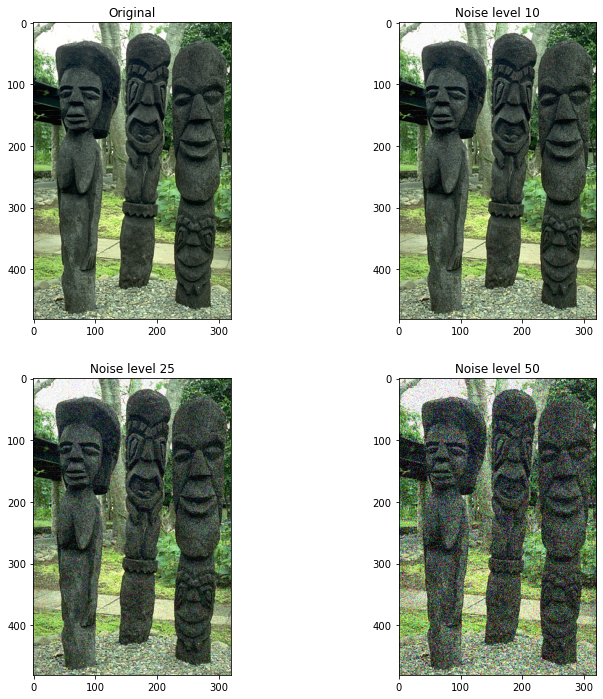

In [5]:
from PIL import Image
import glob

nois10 = []
for filename in glob.glob('Images/noisy10/*.png'): 
    im=Image.open(filename)
    nois10.append(np.asarray(im))
    
nois25 = []
for filename in glob.glob('Images/noisy25/*.png'): 
    im=Image.open(filename)
    nois25.append(np.asarray(im))

nois50 = []
for filename in glob.glob('Images/noisy50/*.png'): 
    im=Image.open(filename)
    nois50.append(np.asarray(im))
    
org = []
for filename in glob.glob('Images/original/*.png'): 
    im=Image.open(filename)
    org.append(np.asarray(im))
    

def display_img(num):
    plt.figure()
    f, ((ax1, ax2), (ax3, ax4))= plt.subplots(2, 2, figsize=(12,12))
    
    ax1.imshow(org[num])
    ax1.set_title('Original')
    
    ax2.imshow(nois10[num])
    ax2.set_title('Noise level 10')
    
    ax3.imshow(nois25[num])
    ax3.set_title('Noise level 25')
    
    ax4.imshow(nois50[num])
    ax4.set_title('Noise level 50')
    
display_img(8)

## Identify the noise in image 
#### by plotting histogram of homogeneous region of graycale image

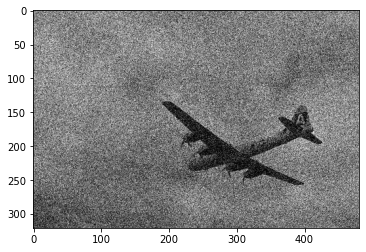

In [6]:
plt.imshow(rgb2gray(nois50[0]), cmap='gray')

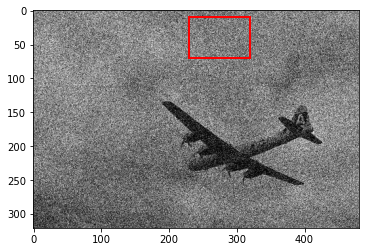

In [14]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(rgb2gray(nois50[0]), cmap='gray')

# Create a Rectangle patch
rect = patches.Rectangle((230, 70), 90, -60, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

### I will take this region as it appears the most homogeneous patch of all images 

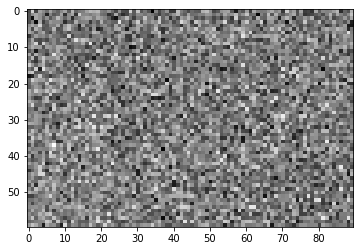

In [301]:
gray_homogeneous = rgb2gray(nois50[0][10:70,230:320])
plt.imshow(gray_homogeneous,cmap='gray')

(array([  0.,   0.,   1.,   4.,   5.,  13.,  25.,  30.,  29.,  34.,  55.,
         74.,  84.,  82., 110., 125., 169., 209., 235., 238., 241., 275.,
        312., 268., 350., 296., 280., 252., 260., 214., 183., 184., 158.,
        125., 118.,  82.,  68.,  61.,  49.,  34.,  25.,  13.,  18.,  10.,
          1.,   0.,   0.,   1.,   0.]),
 array([0.        , 0.02040816, 0.04081633, 0.06122449, 0.08163265,
        0.10204082, 0.12244898, 0.14285714, 0.16326531, 0.18367347,
        0.20408163, 0.2244898 , 0.24489796, 0.26530612, 0.28571429,
        0.30612245, 0.32653061, 0.34693878, 0.36734694, 0.3877551 ,
        0.40816327, 0.42857143, 0.44897959, 0.46938776, 0.48979592,
        0.51020408, 0.53061224, 0.55102041, 0.57142857, 0.59183673,
        0.6122449 , 0.63265306, 0.65306122, 0.67346939, 0.69387755,
        0.71428571, 0.73469388, 0.75510204, 0.7755102 , 0.79591837,
        0.81632653, 0.83673469, 0.85714286, 0.87755102, 0.89795918,
        0.91836735, 0.93877551, 0.95918367, 0.979591

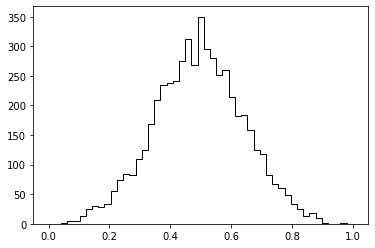

In [302]:
v = np.concatenate(gray_homogeneous)
bins = np.linspace(0, 1, 50)
plt.hist(v, bins, color='k', histtype='step')

#### This bell shape/gaussian curve tells us the noise present is Gaussian noise

In [305]:
# FINDING NOISE LEVEL (STANDARD DEVIATION)

np.std(nois50[0][10:70,230:320])

49.84882341490599

#### std of 50 explains the noise is Gaussian noise with σ = 50 

In [506]:

def median_filter(denoise, lvl):


    j=0
    for i in denoise:
        if (lvl == 10):
            col = cv2.cvtColor(nois10[i], cv2.COLOR_RGB2HSV)        
        elif (lvl == 25):
            col = cv2.cvtColor(nois25[i], cv2.COLOR_RGB2HSV)        
        elif (lvl ==50):
            col = cv2.cvtColor(nois50[i], cv2.COLOR_RGB2HSV)        
        else:
            print('Print select appropriate noise level')
        

        new = cv2.medianBlur(col,9)
        new = cv2.cvtColor(new, cv2.COLOR_HSV2RGB)
        
        # PLOTTING
        fig = plt.figure(figsize=(12,12))

        ax = plt.subplot(121)
        p  = ax.imshow(new)
        ax.set_title('Denoised image')
        
        ax = plt.subplot(122)
        p = ax.imshow(org[i])
        ax.set_title('Original image')
        
        
        
        print('Comparison of Image',j)
        compare(new, org[i])
        j+=1
    
        

Comparison of Image 0
SSIM value is : 0.3827548068208741
MSE value is : 1559.7821041746276 

Comparison of Image 1
SSIM value is : 0.3743002611343748
MSE value is : 2039.949166995896 

Comparison of Image 2
SSIM value is : 0.45794950216875724
MSE value is : 1100.5351865164948 

Comparison of Image 3
SSIM value is : 0.44905587883219855
MSE value is : 896.5299814552151 



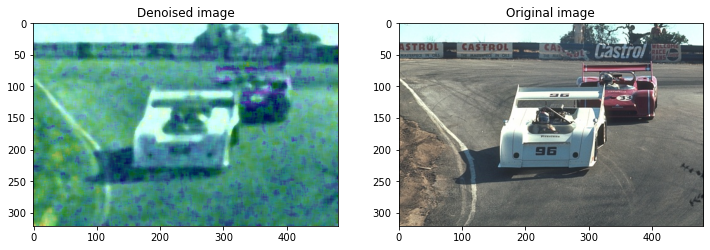

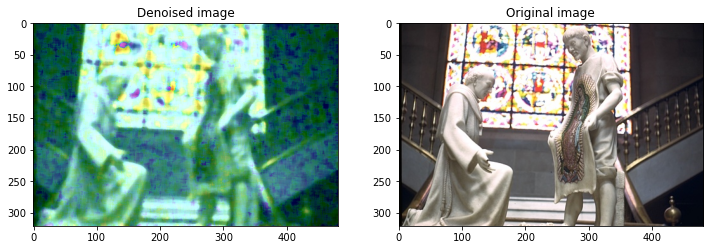

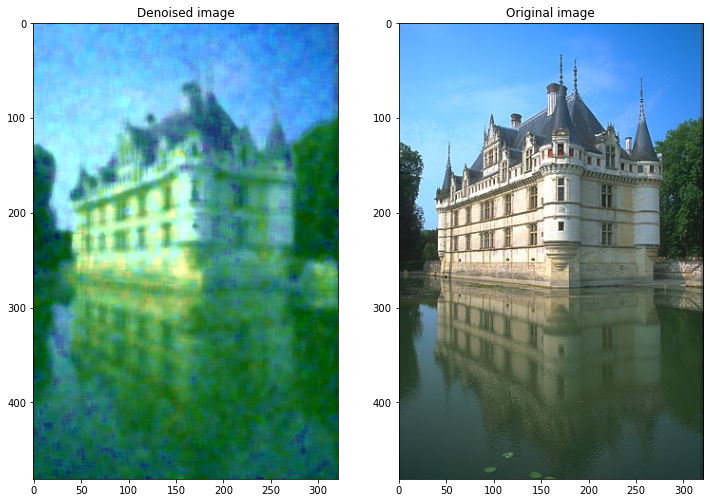

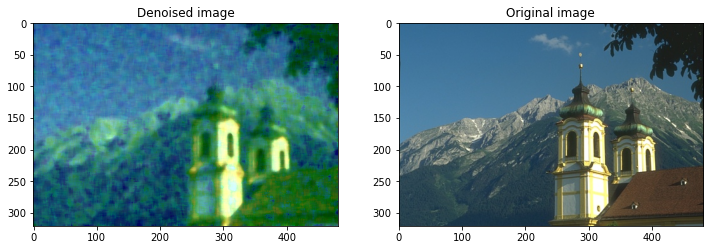

In [519]:
denoise = [5,6,10,20]
median_filter(denoise,50)

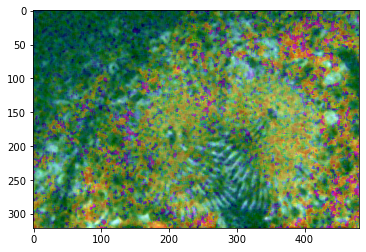

In [225]:
col = cv2.cvtColor(nois50[1], cv2.COLOR_RGB2HSV)

new = cv2.medianBlur(col,5)
new = cv2.cvtColor(new, cv2.COLOR_HSV2RGB)

plt.imshow(new)

In [226]:
compare(new, org[1])

SSIM value is : 0.25952189394715264
MSE value is : 2340.9827872444694


In [511]:
# BM3D filter

def bm3d(denoise, lvl):
    import bm3d
    j=0
    for i in denoise:
        if (lvl == 10):
            imd = bm3d.bm3d(img_as_float(nois10[i]), sigma_psd=45/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)
        elif (lvl == 25):
            imd = bm3d.bm3d(img_as_float(nois25[i]), sigma_psd=45/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)
        elif (lvl ==50):
            imd = bm3d.bm3d(img_as_float(nois50[i]), sigma_psd=45/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)
        else:
            print('Print select appropriate noise level')
        
        # PLOTTING
        fig = plt.figure(figsize=(12,12))

        ax = plt.subplot(121)
        p  = ax.imshow(imd)
        ax.set_title('Denoised image')
        
        ax = plt.subplot(122)
        p = ax.imshow(org[i])
        ax.set_title('Original image')
        
        print('Comparison of Image',j)
        compare(imd, img_as_float(org[i]))
        j+=1
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Comparison of Image 0
SSIM value is : 0.8598843141411487
MSE value is : 0.002253010676977732 



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Comparison of Image 1
SSIM value is : 0.8131307450819234
MSE value is : 0.002518555919372464 



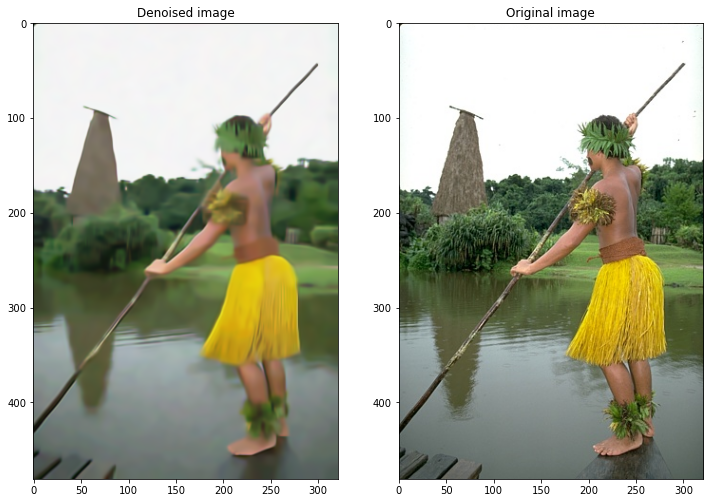

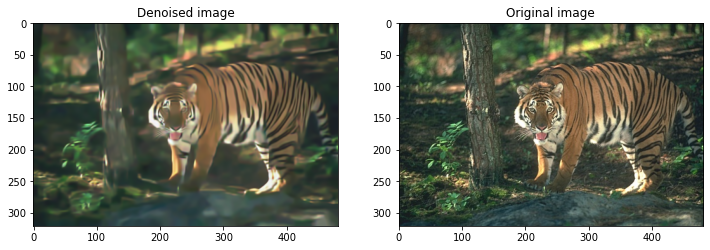

In [512]:
denoise = [9,14]
bm3d(denoise,25)

In [253]:
imd = bm3d.bm3d(nois50[5], sigma_psd=30/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)
plt.imshow(imd)

AttributeError: 'function' object has no attribute 'bm3d'

In [529]:
# mean filter

# CHECK FOR OTHER MEAN FILTERS

def mean_filter(denoise, lvl):


    j=0
    for i in denoise:
        if (lvl == 10):
            col = cv2.cvtColor(nois10[i], cv2.COLOR_RGB2HSV)        
        elif (lvl == 25):
            col = cv2.cvtColor(nois25[i], cv2.COLOR_RGB2HSV)        
        elif (lvl ==50):
            col = cv2.cvtColor(nois50[i], cv2.COLOR_RGB2HSV)        
        else:
            print('Print select appropriate noise level')
        

        new = cv2.blur(col,(6,6))
        new = cv2.cvtColor(new, cv2.COLOR_HSV2RGB)
        
        # PLOTTING
        fig = plt.figure(figsize=(12,12))

        ax = plt.subplot(121)
        p  = ax.imshow(new)
        ax.set_title('Denoised image')
        
        ax = plt.subplot(122)
        p = ax.imshow(org[i])
        ax.set_title('Original image')
        
        
        
        print('Comparison of Image',j)
        compare(new, org[i])
        j+=1
    

Comparison of Image 0
SSIM value is : 0.40224694149852147
MSE value is : 1662.6523662411512 

Comparison of Image 1
SSIM value is : 0.459194081876406
MSE value is : 2093.910177611112 

Comparison of Image 2
SSIM value is : 0.4556191178488482
MSE value is : 1198.0517742760733 

Comparison of Image 3
SSIM value is : 0.43660138805616094
MSE value is : 1031.0104684123376 



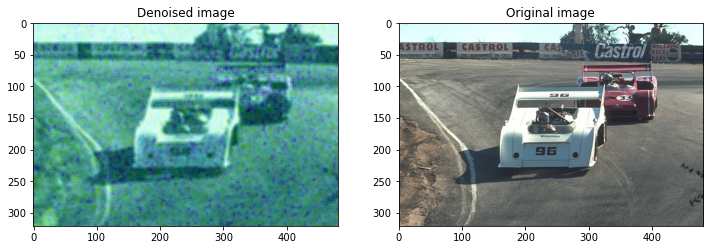

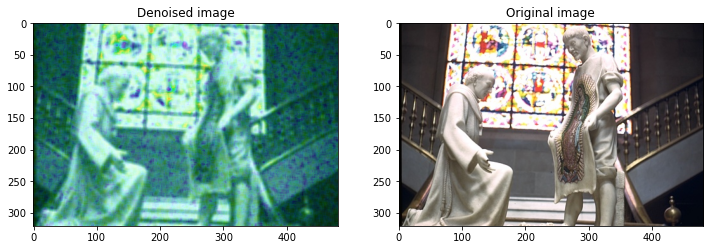

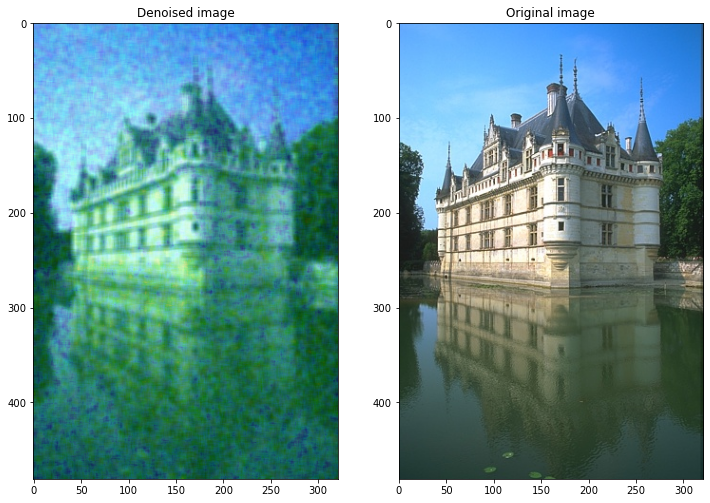

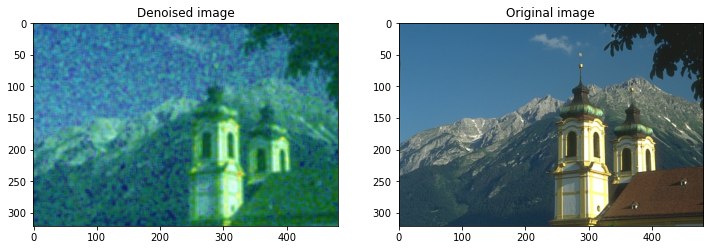

In [530]:
mean_filter(denoise, 50)

In [568]:

compare(nois10[9],org[9])

SSIM value is : 0.6847488840669999
MSE value is : 86.50703903040352 



In [570]:
compare(np.asarray(nois10[9]),np.asarray(org[9]))

SSIM value is : 0.6847488840669999
MSE value is : 86.50703903040352 



In [571]:
ssim(rgb2gray(nois10[9]) , rgb2gray(org[9]))

0.900705156792872

<Figure size 432x288 with 0 Axes>

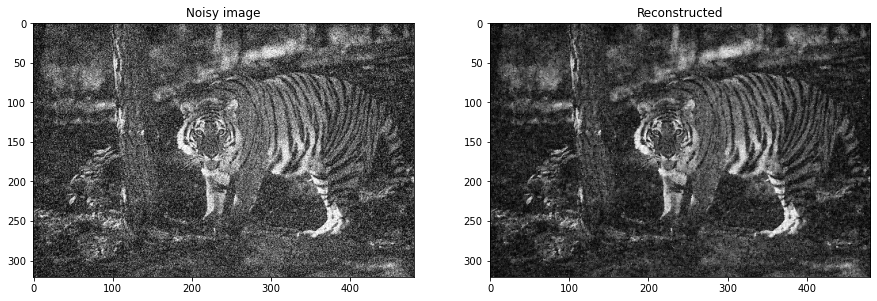

In [99]:
# Mean bilateral filter

from skimage.filters.rank import mean_bilateral
image_new = mean_bilateral(tig50.astype(np.float64), disk(2), s0=10, s1=100)

plt.figure()

f, (ax1, ax3) = plt.subplots(1, 2, figsize=(15,15))
ax3.imshow(image_new, cmap="gray")
ax3.set_title('Mean bilateral filter');

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

## Total variation, Default wavelet, bilateral

<Figure size 432x288 with 0 Axes>

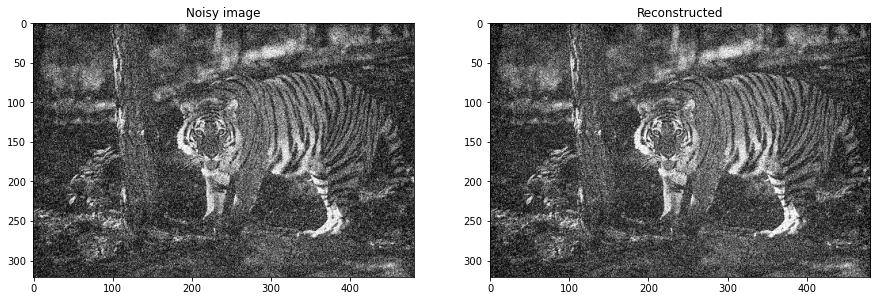

In [55]:
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)

image_new = denoise_bilateral(tig50, sigma_color=0.05, sigma_spatial=15)

#image_new = denoise_tv_chambolle(tig50, weight=0.11)

#image_new = denoise_wavelet(tig50, rescale_sigma=True)

plt.figure()

f, (ax1, ax3) = plt.subplots(1, 2, figsize=(15,15))
ax3.imshow(image_new, cmap="gray")
ax3.set_title('Reconstructed');

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

<Figure size 432x288 with 0 Axes>

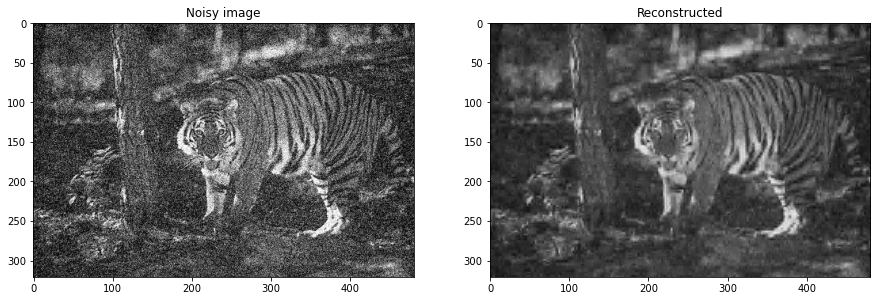

In [131]:
## Caliberated wavelet
from skimage.restoration import calibrate_denoiser
from functools import partial

_denoise_wavelet = partial(denoise_wavelet, rescale_sigma=True)

parameter_ranges = {'sigma': np.arange(0.1, 0.3, 0.02),
                    'wavelet': ['db1', 'db2']}

denoiser = calibrate_denoiser(tig50,
                                         _denoise_wavelet,
                                         denoise_parameters=parameter_ranges)


image_new = denoiser(tig50)


plt.figure()

f, (ax1, ax3) = plt.subplots(1, 2, figsize=(15,15))
ax3.imshow(image_new, cmap="gray")
ax3.set_title('Caliberated wavelet');

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

<Figure size 432x288 with 0 Axes>

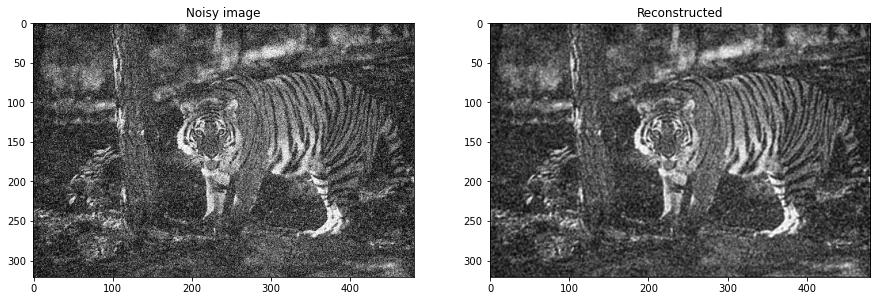

In [31]:
# richardson lucy algorithm

from scipy.signal import convolve2d as conv2

from skimage import color, data, restoration

psf = np.ones((3,3)) / 60

image_new = restoration.richardson_lucy(tig50, psf, num_iter=2)

plt.figure()

f, (ax1, ax3) = plt.subplots(1, 2, figsize=(15,15))
ax3.imshow(image_new, cmap="gray")
ax3.set_title('Reconstructed');

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


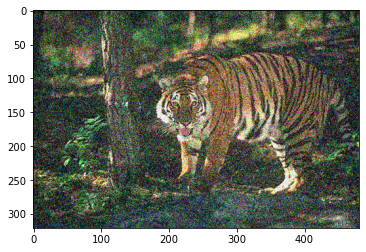

In [38]:
a = fft2(tig50)

b= np.abs(ifft2(a))

plt.imshow(b, cmap='gray')

imfft = fftshift(fft2(tig50))
cx, cy = np.round(np.array(im.shape)/2)
rx = np.round(np.array(im.shape[0])/2)
ry = np.round(np.array(im.shape[1])/20)
rot = np.deg2rad(0)
rr, cc = ellipse(cx, cy, rx, ry, rotation=rot)
imw = np.zeros_like(im)
imw[rr, cc] = 1
imfft[imw==0] = 0
imf = np.abs(ifft2(imfft))

In [39]:
a.shape

(321, 481, 3)

<Figure size 432x288 with 0 Axes>

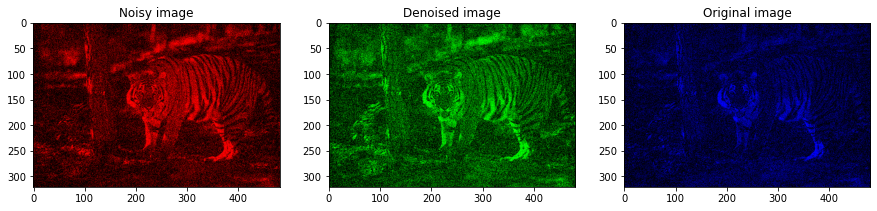

In [94]:
def rgb_isolate_channel(im, ch):
    imc = im.copy()
    for c in range(im.shape[2]):
        if c != ch:
            imc[:,:,c] = np.zeros_like(im[:,:,c])
    return imc
im = tig50
imr = rgb_isolate_channel(im, 0)
img = rgb_isolate_channel(im, 1)
imb = rgb_isolate_channel(im, 2)

plot3(imr,img,imb)

In [96]:
imr.shape

(321, 481, 3)

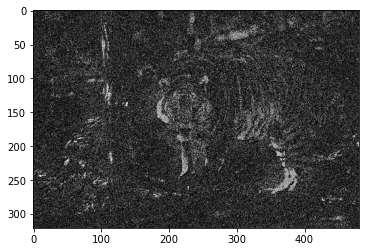

In [196]:
## low pass on rgb image
# from skimage.draw import ellipse, disk


# transformed_channels = []
# for i in range(3):
#     imfft = fftshift(fft2((tig50[:, :, i])))
#     cx, cy = np.round(np.array(tig50[:, :, i].shape)/4)
#     r = np.round(np.array(tig50[:, :, i].shape[1])/3)
    
#     rr, cc = disk((cx, cy), r, shape=tig50[:, :, i].shape)
#     imw = np.zeros_like(tig50[:, :, i])
#     imw[rr, cc] = 1
    
#     rr, cc = disk((3*cx, 3*cy), r, shape=tig50[:, :, i].shape)
#     imw[rr, cc] = 1
#     imfft[imw==0] = 0
#     imf = np.abs(ifft2(imfft))
#     transformed_channels.append(imf)
    
# final_image = np.dstack([transformed_channels[0], 
#                              transformed_channels[1], 
#                              transformed_channels[2]])

# final_image.shape
# plt.imshow(final_image)


## HIGH PASS ON RGB IMAGE

fig = plt.figure()

r = np.array([1,3, 5, 10, 20])
for i in range(0, r.shape[0]):
    imw = np.zeros_like(tig50)
    cx, cy = np.round(np.array(tig50.shape)/2)
    # rr, cc = circle(cx, cy, r[i], im.shape) # for older version of skimage
    rr, cc = disk((cx, cy), 5, shape=tig50.shape)
    imw[rr, cc] = 1
    imfft = fftshift(fft2(tig50))
    imfft[imw==1] = 0
    imf = np.abs(ifft2(imfft))
    plt.imshow(imf, cmap = 'gray')



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.6648885135574378

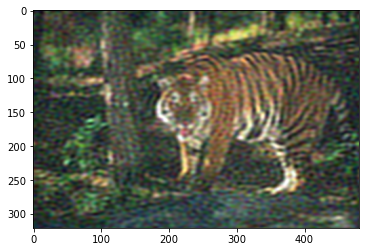

In [168]:
def low(t,m,n):
    blank = np.zeros([m,n])
    
    for u in range(m):
        for v in range(n):
            d = np.sqrt((u-m/2)**2 + (v-n/2)**2)
            if d > t:
                blank[u][v] = 0
            else:
                blank[u][v] = 1
    low_pass = blank
    plt.imshow(low_pass)
    return low_pass
        
    
transformed_channels = []
for i in range(3):
    imfft = fftshift(fft2((tig50[:, :, i])))
    
    gg = np.multiply(imfft,low(50,321,481))  
    imf = np.abs(ifft2(gg))
    transformed_channels.append(imf)
    
final_image = np.dstack([transformed_channels[0], 
                             transformed_channels[1], 
                             transformed_channels[2]])

# final_image.shape
plt.imshow(final_image)
plt.clim(0,255)
ssim(final_image,tig_org, channel_axis=-1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


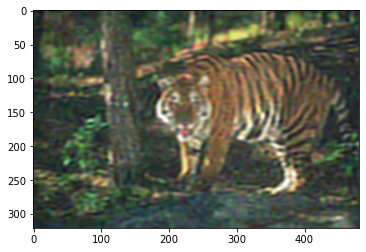

In [173]:
imd = bm3d.bm3d(final_image, sigma_psd=20/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)

plt.imshow(imd)

In [174]:
ssim(imd,tig_org, channel_axis=-1)

0.6977963611300794

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

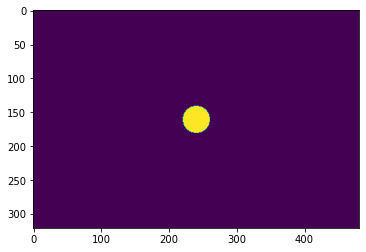

In [141]:
low(20,321,481)

In [148]:
transformed_channels

[array([[0.12471505, 0.11366206, 0.10439996, ..., 0.16494788, 0.15075531,
         0.13720922],
        [0.1291009 , 0.11796571, 0.1085596 , ..., 0.16871632, 0.15492291,
         0.14156647],
        [0.13565637, 0.12453451, 0.11503888, ..., 0.17417648, 0.16096701,
         0.14796173],
        ...,
        [0.12580254, 0.11585087, 0.10759838, ..., 0.16386821, 0.15003637,
         0.13726964],
        [0.12317094, 0.11269547, 0.10399541, ..., 0.16268711, 0.14845149,
         0.13518145],
        [0.1227381 , 0.11189749, 0.10286352, ..., 0.1629676 , 0.1486159 ,
         0.13508889]]),
 array([[0.16893704, 0.15554484, 0.143394  , ..., 0.21206306, 0.19765471,
         0.18312743],
        [0.17036893, 0.15704232, 0.1449003 , ..., 0.2125277 , 0.19861342,
         0.18439438],
        [0.17411597, 0.16084572, 0.14868904, ..., 0.21528117, 0.2018753 ,
         0.18797445],
        ...,
        [0.1771515 , 0.16401746, 0.15216646, ..., 0.22113951, 0.20602972,
         0.19126182],
        [0.1

In [98]:
plt(imfft)

TypeError: 'module' object is not callable

Minimum value:  0
Maximum value:  1


In [313]:
# weiner

# from skimage import color, data, restoration
# img = color.rgb2gray(data.astronaut())
# from scipy.signal import convolve2d
# psf = np.ones((5, 5)) / 25
# tig50_cnv = convolve2d(tig50, psf, 'same')

# rng = np.random.default_rng()
# tig50_cnv += 0.1 * tig50_cnv.std() * rng.standard_normal(tig50_cnv.shape)
# image_new = restoration.wiener(tig50_cnv, psf, 1)

# plt.figure()

# f, (ax1, ax3) = plt.subplots(1, 2, figsize=(15,15))
# ax3.imshow(image_new, cmap="gray")
# ax3.set_title('Weiner');

# ax1.imshow(tig50, cmap="gray")
# ax1.set_title('Noisy image');


## WEINER FROM SCRATCH IN FFT  PLUS NLM



from scipy.signal import gaussian, convolve2d



        


def wiener_filter(img, kernel, K):
    #kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy)
    kernel = fft2(kernel, s = img.shape[0:2])   # this i have to split channels and do fft on each
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

def gaussian_kernel(kernel_size = 1):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h
# Apply Wiener Filter
kernel = gaussian_kernel(6)
filtered_img = wiener_filter(tig50, kernel, K = 0.3)
plt.imshow(filtered_img, cmap='gray')

ValueError: operands could not be broadcast together with shapes (321,481,3) (321,481) 

In [312]:
tig50.shape

(321, 481, 3)

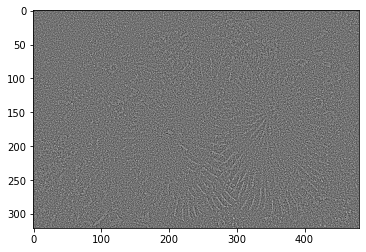

In [35]:
# high pass filter
from scipy import ndimage

lowpass = ndimage.gaussian_filter(coral50, 1)
gauss_highpass = cor50- lowpass
plt.imshow(gauss_highpass, cmap='gray')

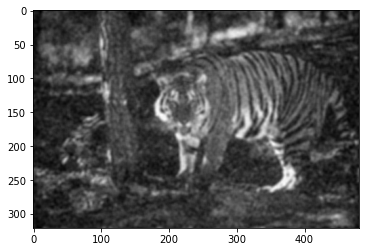

In [216]:
plt.imshow(filtered_img, cmap='gray')

In [301]:
kernel = gaussian_kernel(3)
filtered_img = wiener_filter(tig50, kernel, K = 0.4
                            )

gg = filtered_img + 0.002*gauss_highpass

plt.imshow(gg, cmap='gray')
ssim(gg,cor_org)

# nlm on gg 

sigma_est = np.mean(estimate_sigma(filtered_img, multichannel=False))
imd = denoise_nl_means(filtered_img, h=3 * sigma_est, sigma=sigma_est/0.4, fast_mode=True, **patch_kw)

plt.imshow(imd, cmap='gray')

compare(imd, tig_org)
min_max(imd)

ValueError: when given, axes and shape arguments have to be of the same length

In [134]:
min_max(imd)

compare(imd*1.88, cor_org)

Minimum value:  0.08266683229338326
Maximum value:  0.5348336483418022
SSIM value is : 0.6506762914499546
MSE value is : 0.006676114337365259


In [139]:


def rescale(im1,im2):
    old_value = im1
    old_min = im1.min()
    old_max = im1.max()
    new_min = im2.min()
    new_max = im2.max()
    new_value = ( (old_value - old_min) / (old_max - old_min) ) * (new_max - new_min) + new_min
    return new_value

imm = rescale(imd, cor_org)

SSIM value is : 0.6489874367294712
MSE value is : 0.007381294820379333


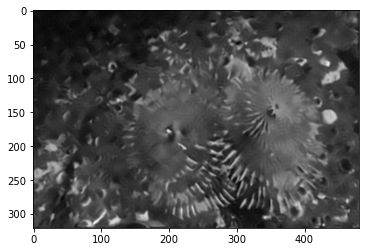

In [143]:
compare(imm,cor_org)
plt.imshow(imm,cmap='gray')

In [144]:
compare(imm,imd)

SSIM value is : 0.839830548019172
MSE value is : 0.020684388752640573


<ipython-input-128-cd7483c06103>:1: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(cor50, multichannel=False))


SSIM value is : 0.7573543760890605
MSE value is : 0.00321077465962328
Minimum value:  0.08339158367361008
Maximum value:  0.9592630045750525


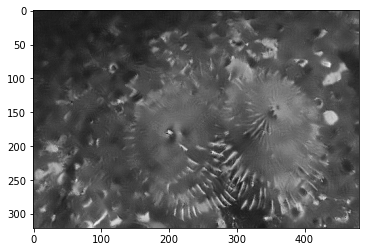

In [128]:
sigma_est = np.mean(estimate_sigma(cor50, multichannel=False))
imd = denoise_nl_means(cor50, h=0.75 * sigma_est, sigma=sigma_est/2, fast_mode=True, **patch_kw)

plt.imshow(imd, cmap='gray')

compare(imd, cor_org)


## weiner plus NLM

<ipython-input-356-1142165e89c9>:4: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(filtered_img, multichannel=False))


0.6699964935275242

<Figure size 432x288 with 0 Axes>

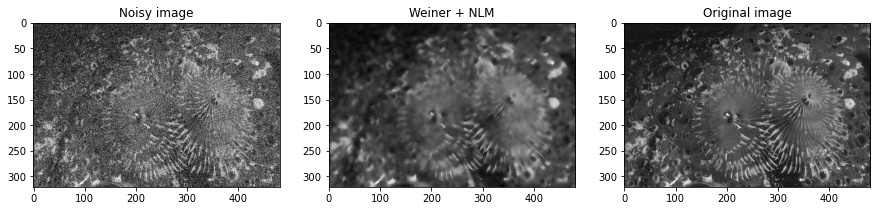

In [356]:
patch_kw = dict(patch_size=4,      # 5x5 patches
                patch_distance=4)  # 13x13 search area

sigma_est = np.mean(estimate_sigma(filtered_img, multichannel=False))
imd = denoise_nl_means(filtered_img, h=3 * sigma_est, sigma=sigma_est/0.5, fast_mode=True, **patch_kw)

plt.figure()

f, (ax1,ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))

ax1.imshow(coral50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(imd, cmap="gray")
ax2.set_title('Weiner + NLM');

ax3.imshow(cor_org, cmap="gray")
ax3.set_title('Original image');

ssim(gg, cor_org)

## BM3D filter

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


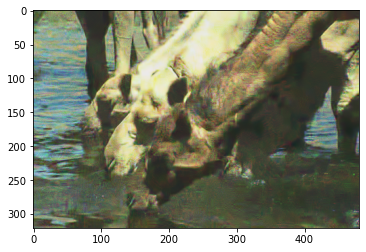

In [265]:
#import bm3d

imd = bm3d.bm3d(img_as_float(nois50[3]), sigma_psd=38/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)

plt.imshow(imd)


1.0

In [267]:
compare(imd, img_as_float(org[3]))

SSIM value is : 0.7712921621530286
MSE value is : 0.0036670849341412294 



0.8267359477293683

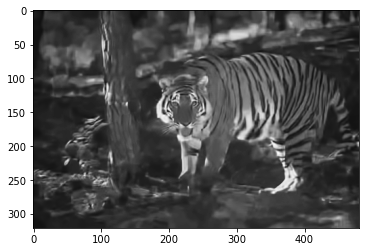

In [392]:
#imd = bm3d.bm3d(tig50, sigma_psd=30/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
imd = bm3d.bm3d(tig50, sigma_psd=38/255, stage_arg=bm3d.BM3DStages.ALL_STAGES)
plt.imshow(imd, cmap='gray')
ssim(imd, tig_org)

In [206]:
imd = bm3d.bm3d(pln10, sigma_psd=38/255, stage_arg=bm3d.BM3DStages.SOFT_THRESHOLDING)
plt.imshow(imd, cmap='gray')
ssim(imd, pln_org)

AttributeError: SOFT_THRESHOLDING

<ipython-input-400-8b4e90350ed0>:3: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(imd, multichannel=False))


0.9719540809519593


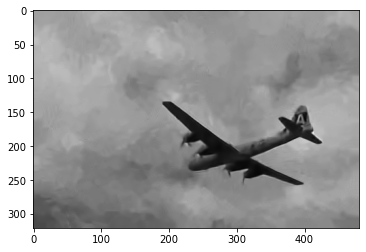

In [400]:
# applying NLM after BM3D

sigma_est = np.mean(estimate_sigma(imd, multichannel=False))
imd = denoise_nl_means(imd, h=0.75 * sigma_est, fast_mode=True)

print(ssim(imd, pln_org))
plt.imshow(imd, cmap='gray')

In [375]:
# Low pass filter



1.0

In [61]:
image = img_as_float(io.imread('0014n.png'))

In [59]:
image_org = img_as_float(io.imread('0014.png'))

In [196]:
## Fast NLM without sigma (without patch)

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.75 * sigma_est, fast_mode=True)


# with h=0.75 , SSIM value is : 0.7634322241584779
#               MSE value is : 0.0037691530047628302

In [249]:
## Fast NLM with sigma      without patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.6 * sigma_est, sigma=sigma_est/1.2, fast_mode=True)


# sigma/1.2
# SSIM value is : 0.7769441081013282
# MSE value is : 0.0034319102364797354

In [300]:
## SLOW NLM without SIGMA   without patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.95 * sigma_est,  fast_mode=False)


# h = 0.95 

# SSIM : 0.7643

In [283]:
## Slow NLM with sigma         without patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.6 * sigma_est, sigma=sigma_est/0.94, fast_mode=False)


# SIGMA/0.93

# SSIM value is : 0.7768041021642346
# MSE value is : 0.0033497571534283903

### adding patch

In [59]:
patch_kw = dict(patch_size=7,      # 5x5 patches
                patch_distance=6)  # 13x13 search area

In [380]:
## Fast NLM with sigma with patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.6 * sigma_est, sigma=sigma_est/1.05, fast_mode=True, **patch_kw)


# h =0.6
# SSIM value is : 0.7761094359597812
# MSE value is : 0.0033005187073340413

In [23]:
patch_kw = dict(patch_size=5,      # 5x5 patches
                patch_distance=6)  # 13x13 search area

In [395]:
## Fast NLM WITHOUT sigma with patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=0.95 * sigma_est, fast_mode=True, **patch_kw)


# SSIM = 0.756


In [435]:
## Slow NLM with sigma with patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=1.1 * sigma_est, sigma=sigma_est/1.05, fast_mode=False, **patch_kw)


# h = 1.1
# SSIM = 0.756


In [45]:
## Slow NLM without sigma with patch

sigma_est = np.mean(estimate_sigma(tig50, multichannel=False))
imd = denoise_nl_means(tig50, h=1.3 * sigma_est, fast_mode=False, **patch_kw)


# h =1.3
# SSIM: 0.7475


<Figure size 432x288 with 0 Axes>

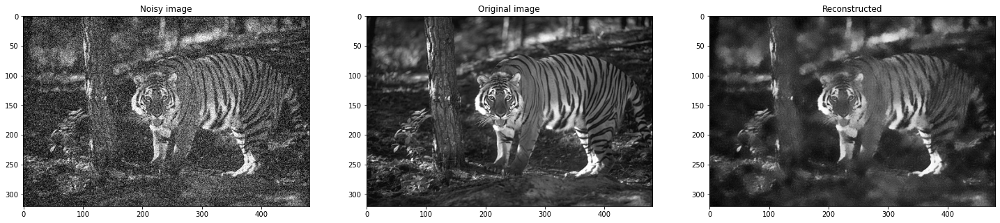

In [46]:
plt.figure()

f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(25,25))

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(tig_org, cmap = 'gray')
ax2.set_title('Original image');

ax3.imshow(imd, cmap="gray")
ax3.set_title('Reconstructed');





In [419]:
yo = imd
print(yo)

[[0.16514495 0.16214089 0.1469262  ... 0.17059884 0.1396679  0.151408  ]
 [0.15498112 0.15974693 0.15324461 ... 0.14767051 0.14747581 0.16502545]
 [0.16961555 0.14242092 0.15386968 ... 0.14690606 0.1640335  0.15811473]
 ...
 [0.15909797 0.19228195 0.19082178 ... 0.2045113  0.22646353 0.20248333]
 [0.15556543 0.17479547 0.16228213 ... 0.20766321 0.2399667  0.22786893]
 [0.15402735 0.15779038 0.14315871 ... 0.25160926 0.22843227 0.21175089]]


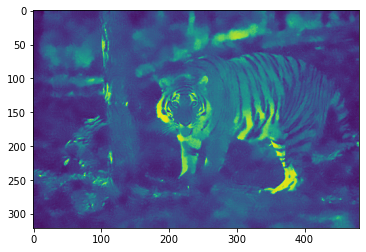

In [410]:
plt.imshow(yo)

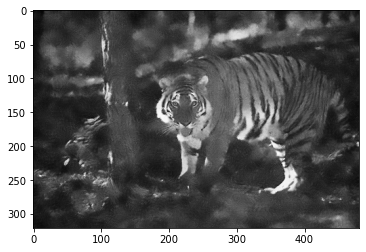

In [411]:
plt.imshow(imd, cmap='gray')

<ipython-input-96-8fe8757b4c32>:4: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img = color.rgb2gray(image)


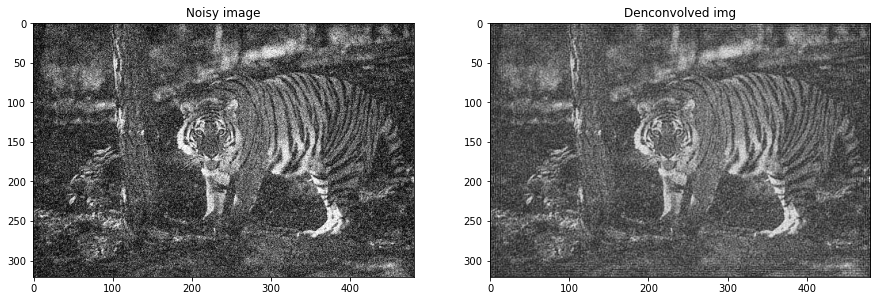

In [96]:
# Wiener filter

from skimage import color, data, restoration
img = color.rgb2gray(image)

from scipy.signal import convolve2d
psf = np.ones((3,3)) / 9
img = convolve2d(img, psf, 'same')
img += 0.01 * img.std() * np.random.standard_normal(img.shape)
deconvolved_img,_ = restoration.unsupervised_wiener(img, psf, clip=False)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))

ax1.imshow(image, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(deconvolved_img, cmap = 'gray')
ax2.set_title('Denconvolved img');


In [79]:
## GAUSSIAN FILTER

from skimage.filters import gaussian, laplace, rank

img2 = gaussian(image, sigma=2)
img3 = gaussian(image, sigma=3)
img5 = gaussian(image, sigma=5)

<ipython-input-79-cd11f70adb83>:3: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  img2 = gaussian(image, sigma=2)
<ipython-input-79-cd11f70adb83>:4: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  img3 = gaussian(image, sigma=3)
<ipython-input-79-cd11f70adb83>:5: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  img5 = gaussian(image, sigma=5)


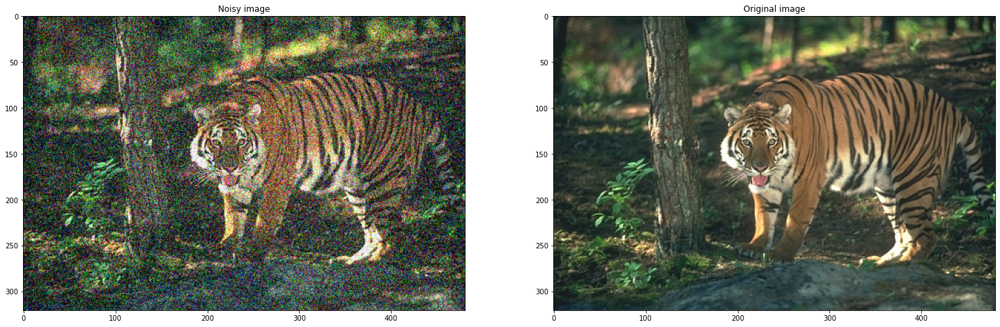

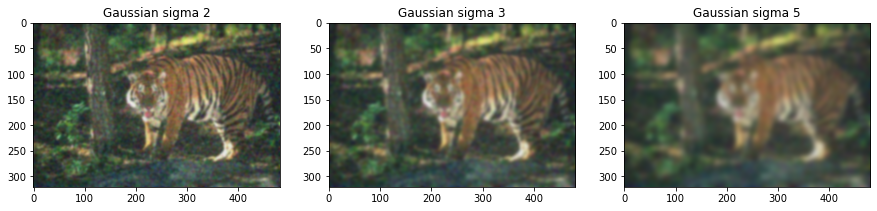

In [80]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,25))

ax1.imshow(image, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(image_org)
ax2.set_title('Original image');

f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(15,15))

ax1.imshow(img2, cmap="gray")
ax1.set_title('Gaussian sigma 2');

ax2.imshow(img3)
ax2.set_title('Gaussian sigma 3');

ax3.imshow(img5, cmap="gray")
ax3.set_title('Gaussian sigma 5');

In [40]:
imf = fftshift(fft2(tig50))

In [41]:
imf = np.log(np.abs(imf))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


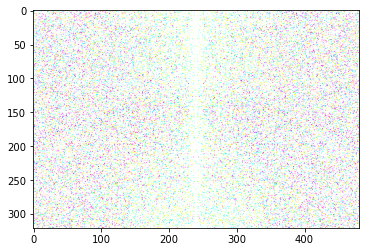

In [42]:
plt.imshow(imf)

In [46]:
imgg = np.abs(ifft2(imf))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


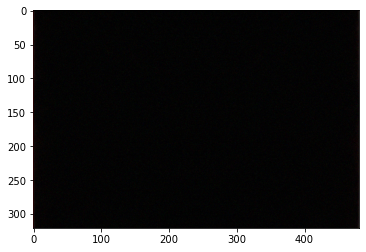

In [47]:
plt.imshow(imgg)

## Gaussian low pass > NLM/Bilateral

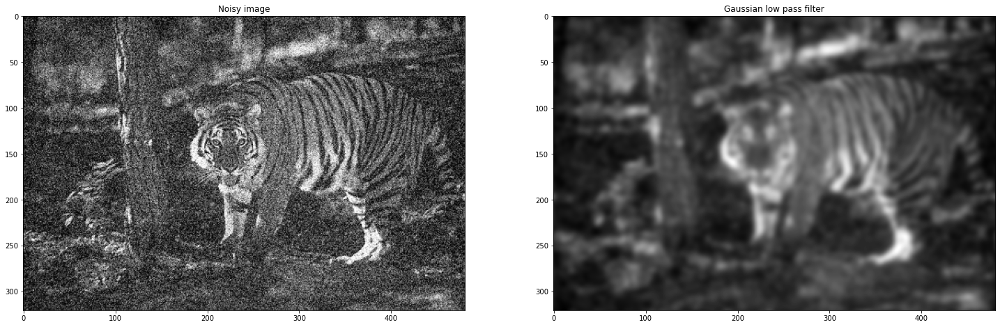

In [145]:
# Gaussian low pass filter

xs, ys = np.array(tig50.shape)
xl = np.linspace(0,xs,xs)
yl = np.linspace(0,ys,ys)
x, y = np.meshgrid(xl, yl)
x = (x-xs/2)/xs
y = (y-ys/2)/ys
s = 0.05
imw = np.exp(-(x**2+y**2)/(2*s**2))
# imw = np.exp(-((x/s)**2+(y/s)**2))
imfft = fftshift(fft2(tig50))
imfft = imfft *imw.T
imf = np.abs(ifft2(imfft))
imm = np.log(np.abs(imfft))
imm = imm * imw.T


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,25))

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(imf, cmap = 'gray')
ax2.set_title('Gaussian low pass filter');

0.6176494735727358

<Figure size 432x288 with 0 Axes>

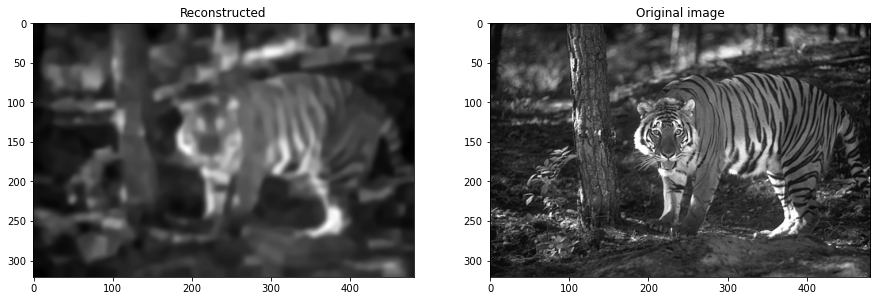

In [158]:
# BM3D after gaussian low pass
imd = bm3d.bm3d(imf, sigma_psd=2/20, stage_arg=bm3d.BM3DStages.ALL_STAGES)

plot2(imd,tig_org)
ssim(imd, tig_org)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.7673634139317241

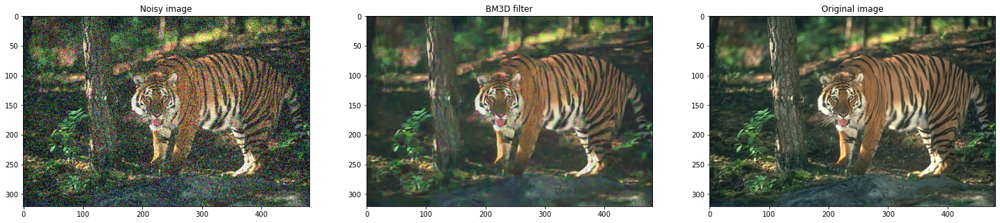

In [348]:
# trying bm3d on color images

tig50 = img_as_float(io.imread('0014n.png'))
tig_org = img_as_float(io.imread('0014.png'))
imd = bm3d.bm3d(tig50, sigma_psd=40/275, stage_arg=bm3d.BM3DStages.ALL_STAGES)




f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25,25))

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(imd, cmap = 'gray')
ax2.set_title('BM3D filter');

ax3.imshow(tig_org, cmap = 'gray')
ax3.set_title('Original image');



#sigma_est = np.mean(estimate_sigma(imd,channel_axis=-1))
#imd = denoise_nl_means(imd, h=0.6 * sigma_est, sigma=sigma_est/1, fast_mode=True, **patch_kw)

ssim(imd, tig_org, channel_axis=-1)

In [349]:


def hist_eq(im, im2):
    
    imeq = equalize_hist(im)
    imeq = img_as_ubyte(imeq)
    v = np.concatenate(imeq)
    bins = np.linspace(0, 255, 50)
    plt.hist(v, bins, histtype='step')
    plt.title("Histogram")
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    plt.show()
    plt.imshow(imeq)
    print(ssim(imeq,im2, channel_axis=-1))
    min_max(imeq)
    min_max(im2)


0.4679460095564896

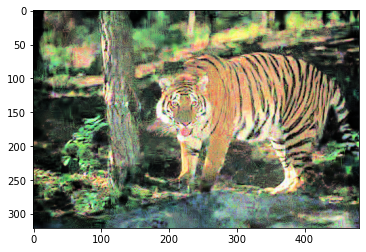

In [369]:
from skimage.color import rgb2hsv, rgb2lab, hsv2rgb
tig_org = (io.imread('0014.png'))

im = imd
im_hsv = rgb2hsv(im)
im_hsv_v_eq = equalize_hist(im_hsv[:,:,2]) # V
im_hsv[:,:,2] = im_hsv_v_eq
im_eq = hsv2rgb(im_hsv)
im_eq = img_as_ubyte(im_eq)

plt.imshow(im_eq)
ssim(im_eq, tig_org, channel_axis=-1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

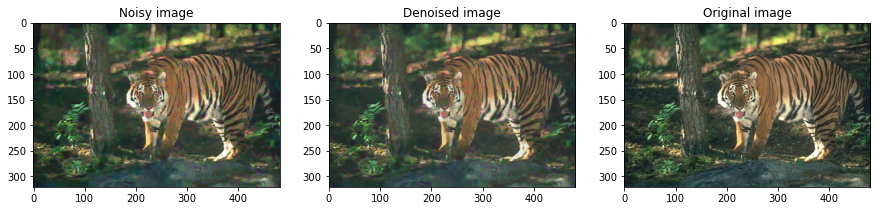

In [360]:
aa = match_histograms(imd, tig_org)
plot3(aa,imd,tig_org)

In [364]:
ssim(aa,tig_org,channel_axis = -1)
mse(imd,tig_org)

0.003741364724440993

C:\Users\ashwi\anaconda3\lib\site-packages\skimage\_shared\utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


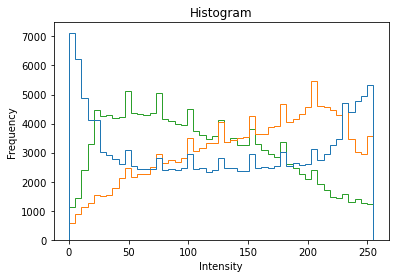

0.3865412785142957
Minimum value:  0
Maximum value:  255
Minimum value:  0
Maximum value:  255


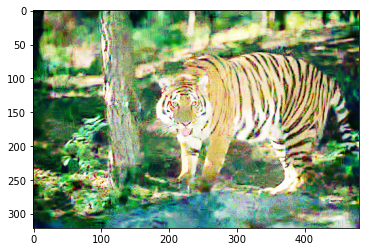

In [337]:
hist_eq(imd,tig_org)


In [509]:
import cv2

def auto_canny(image, sigma=0.33):
    v = np.median(image)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
    return edged
im = auto_canny(imd)

plt.imshow(im)

error: OpenCV(4.7.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\canny.cpp:829: error: (-215:Assertion failed) _src.depth() == CV_8U in function 'cv::Canny'


In [514]:
!pip install Wand

In [515]:
## enhancing image through PIL

from PIL import Image
from PIL import ImageEnhance
  
# Opens the image file
image = Image.open('0014n.png')  
  
# shows image in image viewer
image
  


image

ImportError: MagickWand shared library not found.
You probably had not installed ImageMagick library.
Try to install:
  https://docs.wand-py.org/en/latest/guide/install.html#install-imagemagick-on-windows

In [467]:
from PIL import ImageFilter, Image

tg = Image.open('0014n.png')

image = Image.fromarray(tg)
new_image = image.filter(ImageFilter.UnsharpMask(radius=2, percent=150))
plt.subplot(121),plt.imshow(image, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(new_image, cmap = 'gray')
plt.title('Unsharp Filter'), plt.xticks([]), plt.yticks([])
plt.show()


TypeError: a bytes-like object is required, not 'PngImageFile'

In [490]:
patch_kw = dict(patch_size=4,      # 5x5 patches
                patch_distance=6)  # 13x13 search area

In [8]:
sigma_est = np.mean(estimate_sigma(imf, multichannel=False))
imd = denoise_nl_means(imf, h=0.6 * sigma_est, sigma=sigma_est/1, fast_mode=True, **patch_kw)

<ipython-input-8-4b923b1024e3>:1: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(imf, multichannel=False))


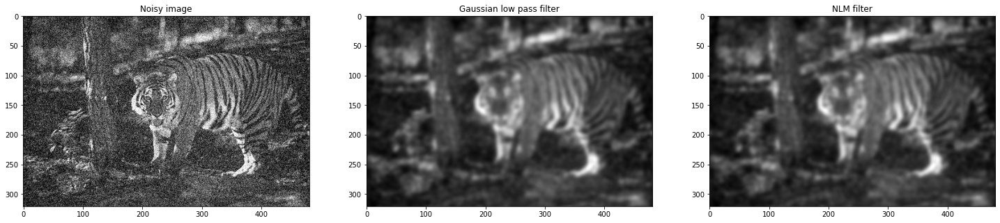

In [9]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25,25))

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(imf, cmap = 'gray')
ax2.set_title('Gaussian low pass filter');

ax3.imshow(imd, cmap = 'gray')
ax3.set_title('NLM filter');

In [10]:
# im_bayes = denoise_wavelet(imf, convert2ycbcr=False,
#                            method='BayesShrink', mode='hard',
#                            rescale_sigma=True)

image_new = denoise_bilateral(imf, sigma_color=0.05, sigma_spatial=20)

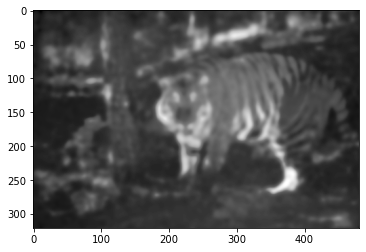

In [11]:
plt.imshow(image_new, cmap='gray')

## Bilateral > Weiner

In [15]:
im1 = denoise_bilateral(tig50, sigma_color=0.05, sigma_spatial=20)

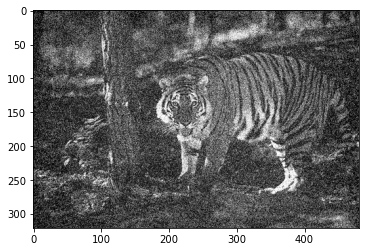

In [16]:
plt.imshow(im1, cmap='gray')

In [29]:
# weiner
from skimage import color, data, restoration

from scipy.signal import convolve2d
psf = np.ones((5,5)) / 25
im1_cnv = convolve2d(im1, psf, 'same')

rng = np.random.default_rng()
im1_cnv += 0.1 * im1_cnv.std() * rng.standard_normal(im1_cnv.shape)
image_new = restoration.wiener(im1_cnv, psf, 1)
plt.imshow(image_new, cmap='gray')

Estimated Gaussian noise standard deviation = 0.13719715654412498


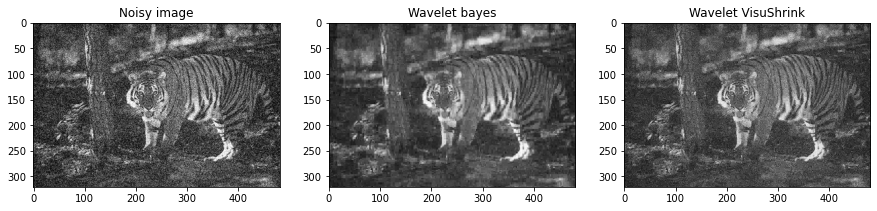

In [246]:
## Wavelet denoising

from skimage.restoration import denoise_wavelet, estimate_sigma

# Estimate the average noise standard deviation across color channels.
sigma_est = estimate_sigma(tig50, average_sigmas=True)
# Due to clipping in random_noise, the estimate will be a bit smaller than the
# specified sigma.
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

im_bayes = denoise_wavelet(tig50, convert2ycbcr=False,
                           method='BayesShrink', mode='soft',
                           rescale_sigma=True)
im_visushrink = denoise_wavelet(tig50, convert2ycbcr=False,
                                method='VisuShrink', mode='soft',
                                sigma=sigma_est/8, rescale_sigma=True)


f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))

ax1.imshow(tig50, cmap="gray")
ax1.set_title('Noisy image');

ax2.imshow(im_bayes, cmap='gray')
ax2.set_title('Wavelet bayes');


ax3.imshow(im_visushrink, cmap='gray')
ax3.set_title('Wavelet VisuShrink');

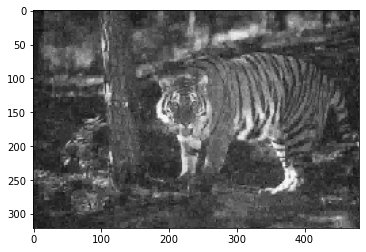

In [445]:

plt.imshow(im_bayes, cmap='gray')

In [477]:
sigma_est = np.mean(estimate_sigma(im_bayes, multichannel=False))
imd = denoise_nl_means(im_bayes, h=0.6 * sigma_est, sigma=sigma_est/0.11, fast_mode=True)


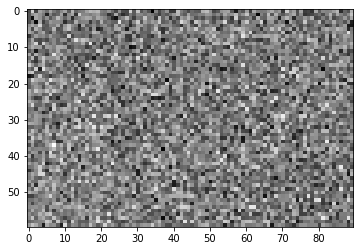

In [179]:
plt.imshow(pln50[10:70,230:320], cmap='gray')

In [181]:
min_max(pln50[10:70,230:320])

Minimum value:  0.04525843137254902
Maximum value:  0.9640913725490197


ValueError: The 'color' keyword argument must have one color per dataset, but 3 datasets and 1 colors were provided

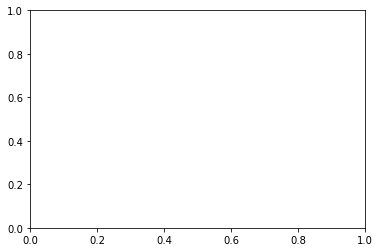

In [202]:
v = np.concatenate(pln50[10:70,230:320])
bins = np.linspace(0, 1, 50)
plt.hist(v, bins, color='k', histtype='step')

In [ ]:
## IT IS A BELL CURVE > shows its a gaussian noise, if we would have got 2 spikes around 0 and 1 then it would be salt and pepper noise

In [203]:
np.std(v)

49.84882341490599